In [1]:
import os
import numpy as np
import cv2
import pickle
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

print('...')

...


## Read all the images

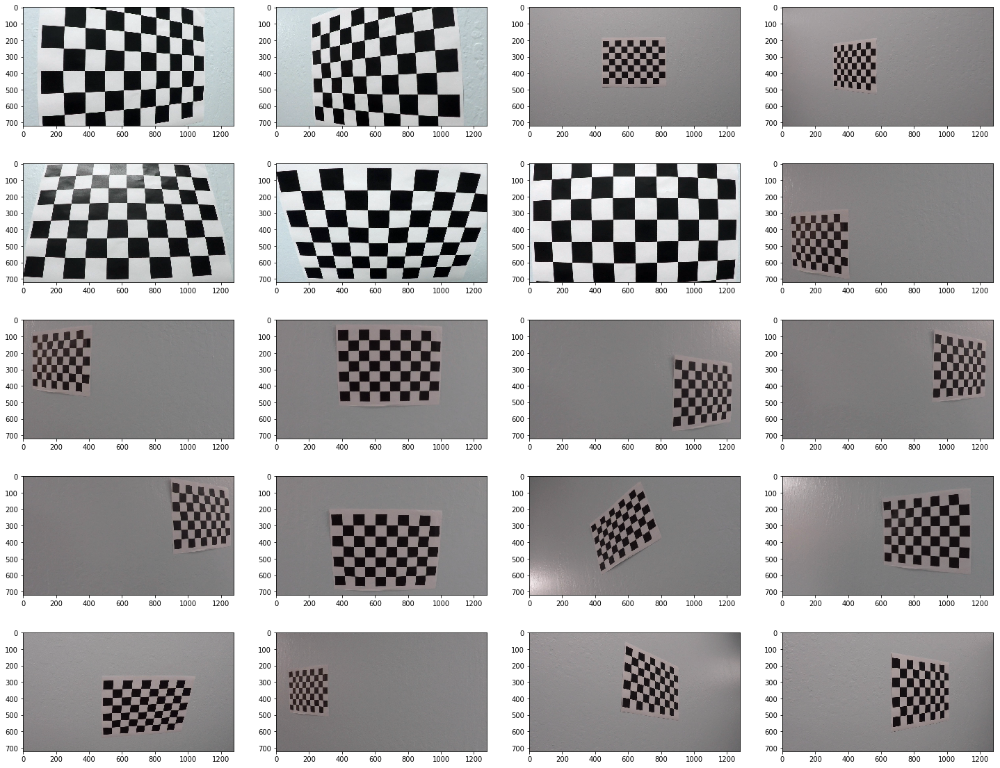

In [2]:
images = glob.glob('./camera_cal/calibration*.jpg')

fig, ax = plt.subplots(5, 4)
fig.set_size_inches(25, 20)

for axis, file in zip(ax.flat, images):
    image = cv2.imread(file)
    axis.imshow(image)

## Develope the code to find corners of a chess board by working on one image

In [3]:
nx = 9
ny = 6

# Read the image
image = cv2.imread(images[6])

# Convert to Gray
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Try and find corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# Check if corners were found and then plot
if ret == True:
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 8)
    
    ax[0].imshow(image)
    ax[0].set_title('original image')
    
    ax[1].imshow(gray)
    ax[1].set_title('gray')
    
    cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
    ax[2].imshow(image)
    ax[2].set_title('with corners')


## Find corners in all the images of a chess board using a for loop

### Here we will perform the previous step for all the images using a for loop

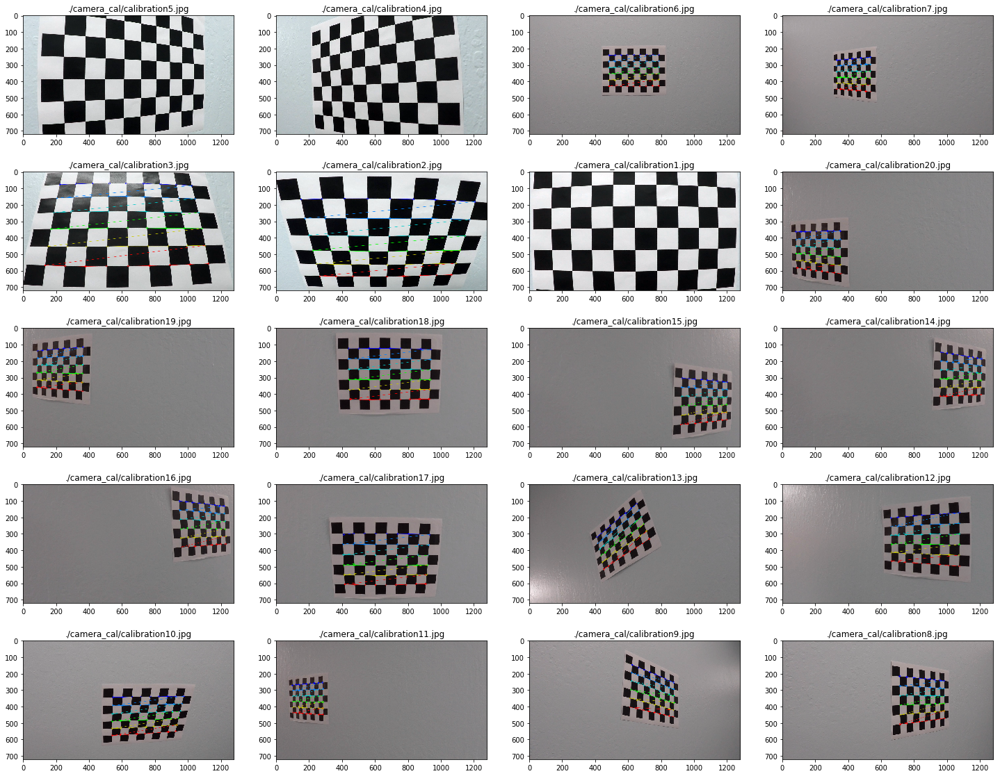

In [4]:
fig, ax = plt.subplots(5, 4)
fig.set_size_inches(25, 20)


for axis, file in zip(ax.flat, images):
    image = cv2.imread(file)
    nx = 9
    ny = 6
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
    axis.imshow(image)
    axis.set_title(file)

## Calculate calibration matrix and distortion coefficients from all the chessboard images

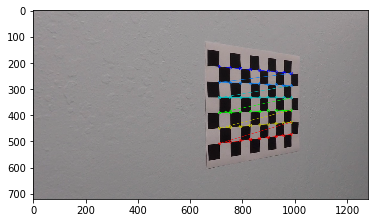

In [5]:
objpoints = []
imgpoints = []
objp=np.zeros((6*9,3),np.float32)
objp[:,:2]=np.mgrid[0:9,0:6].T.reshape(-1,2)

for file in images:
    
    # Read an image
    image = cv2.imread(file)
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Find corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # If corners were found then obtain the calibration matrix and distortion coefficients
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        cv2.drawChessboardCorners(image, (nx, ny), corners, ret)

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        undist = cv2.undistort(image, mtx, dist, None, mtx)  
        
        plt.imshow(undist)
        

## In this step, we will save the calibration matrix and distortion coefficients

[[1.158e+03 0.000e+00 6.670e+02]
 [0.000e+00 1.153e+03 3.860e+02]
 [0.000e+00 0.000e+00 1.000e+00]]


Text(0.5,1,'Undistorted Image')

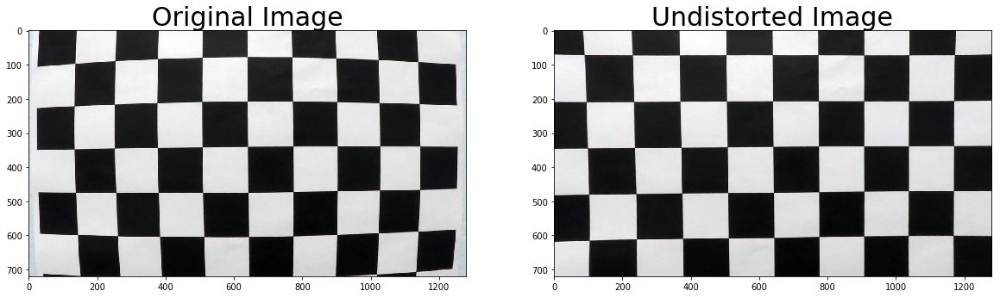

In [114]:
import pickle
%matplotlib inline

# Test undistortion on an image
image = cv2.imread(images[6])
image_size = (image.shape[1], image.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size,None,None)


dst = cv2.undistort(image, mtx, dist, None, mtx)
cv2.imwrite('test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_calibration.p", "wb" ) )
print(np.round(dist_pickle['mtx'], 0))

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

# Undistort an image

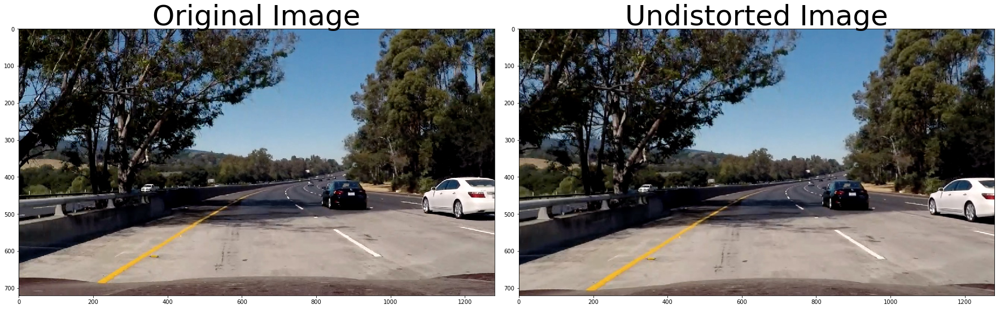

In [94]:
def undistort_image(image, dict):
    mtx = dict["mtx"]
    dist = dict["dist"]
    image = cv2.undistort(image, mtx, dist, None, mtx)
    return image

image = plt.imread('test_images/test5.jpg')
undistorted = undistort_image(image, dist_pickle)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# plt.savefig('trial_undist_test2.jpg')

# Absolute Sobel (Gradient) Thresholding

In [8]:
def abs_sobel_thresh(img, orient = 'x', sobel_kernel = 3, thresh = (0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Define orientation values
    if orient == 'x':
        x = 1
    elif orient == 'y':
        x = 0
    y = 1 - x
    
    # Take the derivative wrt to the orientation
    sobel = cv2.Sobel(gray, cv2.CV_64F, x, y)
    
    # Take the absolute value of the gradient
    abs_sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a mask of 1 based on thresholds
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Return the binary masked image
    return grad_binary
    

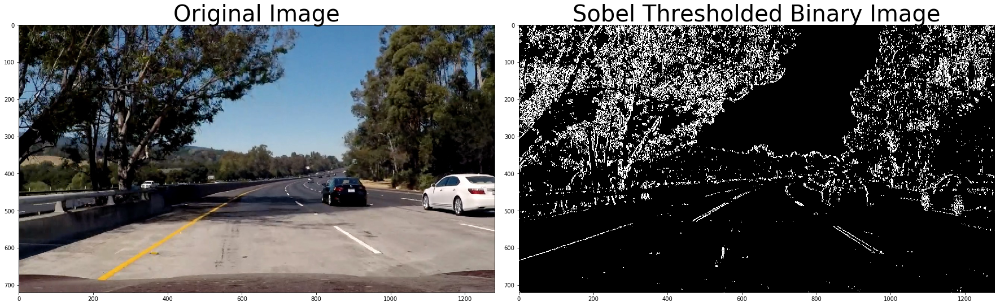

In [95]:
image = plt.imread('test_images/test5.jpg')
result = abs_sobel_thresh(image, 'x', sobel_kernel = 3, thresh = (20, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap = 'gray')
ax2.set_title('Sobel Thresholded Binary Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Magnitude Sobel Thresholding

In [10]:
def mag_thresh(image, sobel_kernel = 3, thresh = (0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take Sobel 'x' and 'y' gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # Calculate the magnitude
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(magnitude)/255
    magnitude = (magnitude/scale_factor).astype(np.uint8)

    # Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(magnitude)
    mag_binary[(magnitude >= thresh[0]) & (magnitude <= thresh[1])] = 1
   
    # Return the thresholded image
    return mag_binary

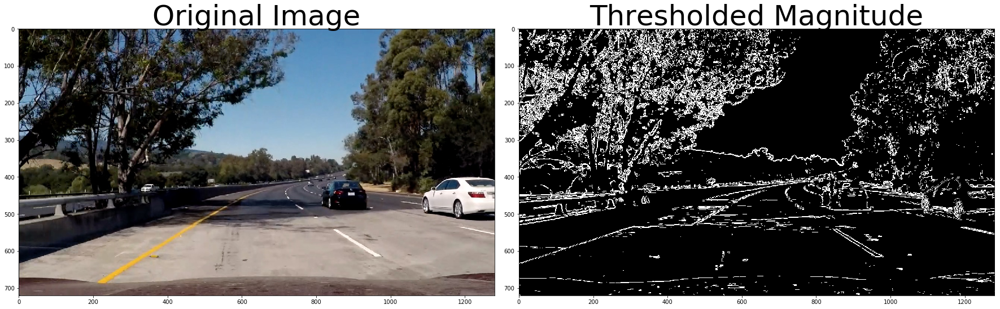

In [96]:
image = plt.imread('test_images/test5.jpg')
mag_binary = mag_thresh(image, sobel_kernel = 3, thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Direction Thresholding

In [12]:
def dir_thresh(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction_gradient = np.arctan2(abs_sobely, abs_sobelx)
    
    # Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(direction_gradient)
    dir_binary[(direction_gradient >= thresh[0]) & (direction_gradient <= thresh[1])] = 1
    
    # Return direction-thresholded image    
    return dir_binary

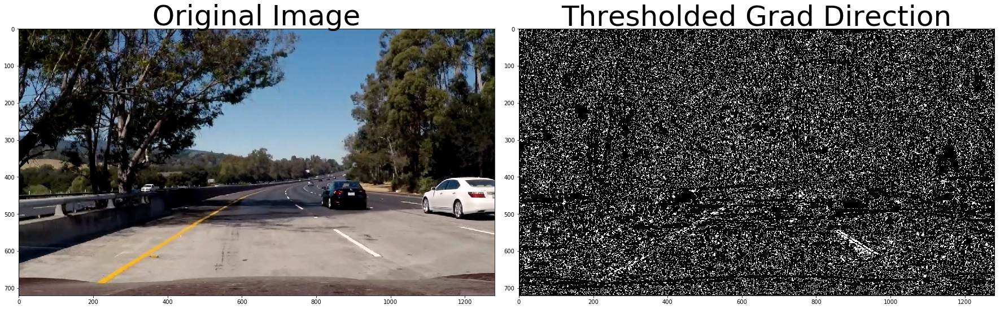

In [97]:
image = plt.imread('test_images/test5.jpg')
# Run the function
dir_binary = dir_thresh(image, sobel_kernel = 7, thresh=(0.9, 1.2))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# S Channel (from HLS) Thresholding

In [14]:
def hls_thresh(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    image_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Apply a threshold to the S channel
    S = image_hls[:, :, 2]
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    # Return a binary image of threshold result
    return binary_output  


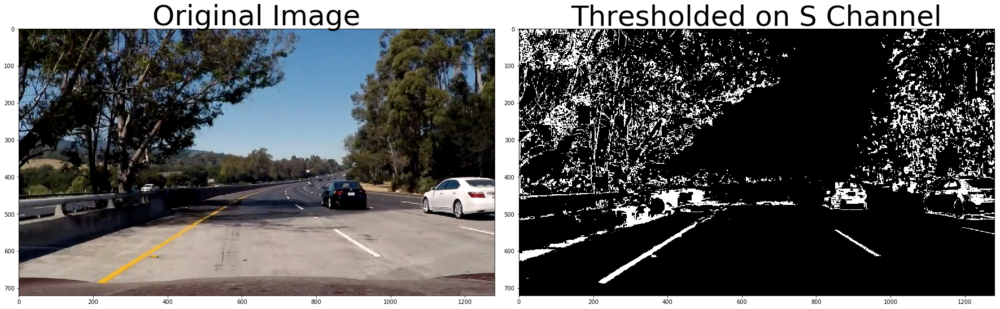

In [98]:
image = plt.imread('test_images/test5.jpg')
hls_binary = hls_thresh(image, thresh=(130, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded on S Channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Combined Thresholds

In [16]:
def combined_thresh(img, abs_thresh = (20, 100), magnitude_thresh = (30, 100), \
                         angle_thresh = (0.7, 1.3), s_thresh = (140, 255)):
    
    gradx = abs_sobel_thresh(img, orient = 'x', sobel_kernel = 3, thresh = abs_thresh)
    grady = abs_sobel_thresh(img, orient = 'y', sobel_kernel = 3, thresh = abs_thresh)
    mag_binary = mag_thresh(img, sobel_kernel = 3, thresh = magnitude_thresh)
    dir_binary = dir_thresh(img, sobel_kernel = 3, thresh = angle_thresh)
    s_binary = hls_thresh(img, thresh = s_thresh)
    
    
    combined_binary = np.zeros_like(gradx)
    combined_binary[(gradx == 1) & (grady ==1) | (mag_binary == 1) & (dir_binary == 1) | s_binary == 1] = 1
    
    return combined_binary

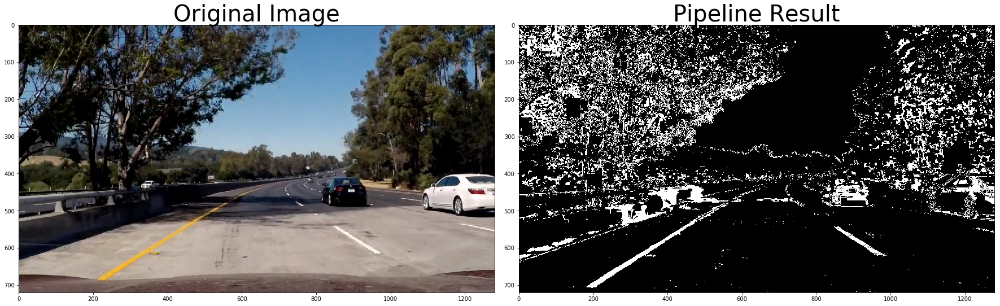

In [99]:
image = plt.imread("test_images/test5.jpg")
combined_result = combined_thresh(undistort_image(image, dist_pickle))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(combined_result, cmap = 'gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
def perspective_transform(image, source, destination):
    
    M = cv2.getPerspectiveTransform(source, destination)
    Minv = cv2.getPerspectiveTransform(destination, source)
    image_size=(image.shape[1],image.shape[0])
    warped = cv2.warpPerspective(image, M, image_size, flags = cv2.INTER_LINEAR)
    return warped, Minv, M

In [116]:
def binary_warp(image, dist_pickle, src, dst):
    return perspective_transform(combined_thresh(undistort_image(image, dist_pickle)), src, dst)[0]

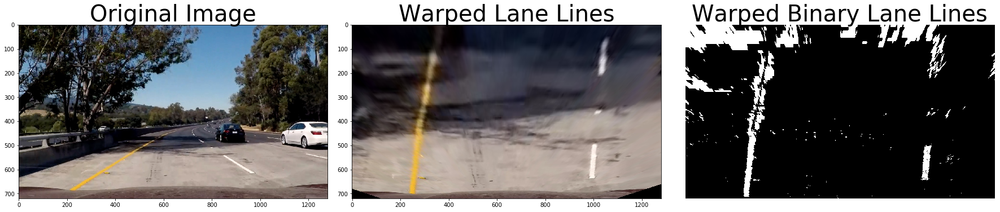

In [117]:
image = plt.imread('test_images/test5.jpg')

src = np.float32([[(300, 720), (570, 470), (720, 470), (1130, 720)]])
dst = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])

warped = perspective_transform(image, src, dst)[0]

binary_warped = binary_warp(image, dist_pickle, src, dst)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize = 40)

ax2.imshow(warped)
ax2.set_title('Warped Lane Lines', fontsize = 40)

ax3.imshow(binary_warped, cmap='gray')
ax3.set_title('Warped Binary Lane Lines', fontsize = 40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.axis('off');

## Lane Lines Detection: Sliding Window Approach

In [101]:
def find_lane_pixels(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 4) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 4) 
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(x = lefty, y = leftx, deg = 2)
    right_fit = np.polyfit(x = righty, y = rightx, deg = 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit


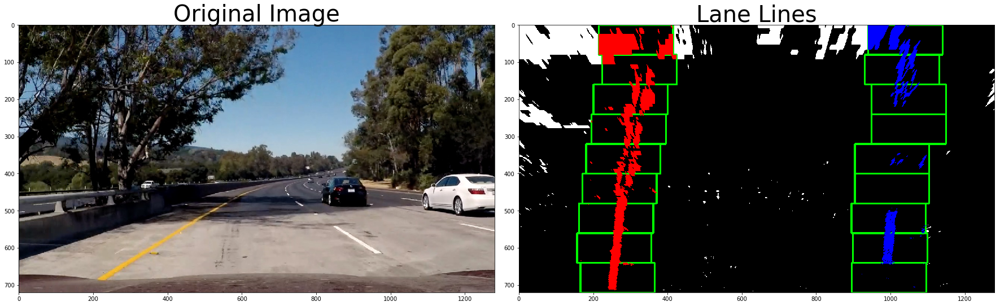

In [102]:
image = plt.imread('test_images/test5.jpg')

binary_warped = perspective_transform(combined_thresh(undistort_image(image, dist_pickle)), src, dst)[0]
out_img, left_fit, right_fit = fit_polynomial(binary_warped)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(out_img, cmap = 'gray')
ax2.set_title('Lane Lines', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Lane Lines Detection: Search from Prior

In [103]:
# Load our image - this should be a new frame since last time!
# binary_warped = mpimg.imread('')

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
# _, left_fit, right_fit = fit_polynomial(binary_warped)

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(x = lefty, y = leftx, deg = 2)
    right_fit = np.polyfit(x = righty, y = rightx, deg = 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
# result = search_around_poly(binary_warped)

# plt.imshow(result)

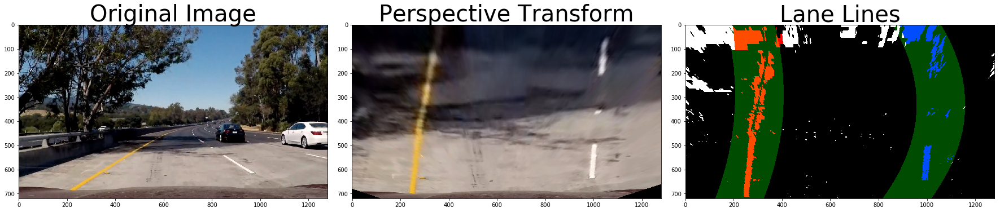

In [104]:
image = plt.imread('test_images/test5.jpg')

warped = perspective_transform(image, src, dst)[0]
binary_warped = perspective_transform(combined_thresh(undistort_image(image, dist_pickle)), src, dst)[0]
result = search_around_poly(binary_warped)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Perspective Transform', fontsize = 40)

ax3.imshow(result, cmap = 'gray')
ax3.set_title('Lane Lines', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Measuring Curvature

In [105]:
def measure_curvature_pixels(binary_warped, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    np.random.seed(0)
    ploty = np.linspace(0, binary_warped.shape[0] - 1, num = binary_warped.shape[0])
    
  
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = round(
        np.power(1+((2*left_fit[0]*y_eval+left_fit[1])**2), 1.5)/(2*np.absolute(left_fit[0])),
        2)
    right_curverad = round(
        np.power(1+((2*right_fit[0]*y_eval+right_fit[1])**2), 1.5)/(2*np.absolute(right_fit[0])),
        2)
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels(binary_warped, left_fit, right_fit)

print(left_curverad, right_curverad)
# Should see values of 1625.06 and 1976.30 here, if using
# the default `generate_data` function with given seed number

1625.06 1976.3


## Draw lines on Original Image

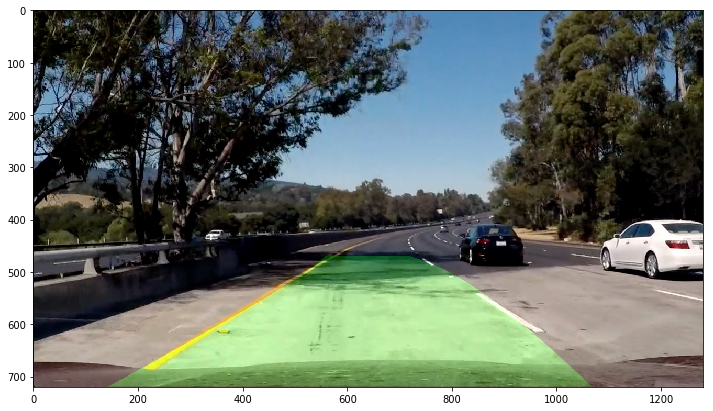

In [130]:
def draw_lines_on_image(original_img, binary_img, left_fit, right_fit, Minv):
    ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0])
    
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (original_img.shape[1], original_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_img, 1, newwarp, 0.25, 0)
    
    return result

image = plt.imread('test_images/test5.jpg')
combined_binary = combined_thresh(image)
binary_warped = binary_warp(image, dist_pickle, src, dst)
_, left_fit, right_fit = fit_polynomial(binary_warped)
new_image = draw_lines_on_image(image, combined_binary, left_fit, right_fit, Minv)

fig, ax1 = plt.subplots(1, 1, figsize = (12, 9))
ax1.imshow(new_image);
